In [1]:
import paddle
import math
import paddle.fluid as fluid
from paddle import nn

class CBAM_Module(nn.Layer):  
    def __init__(self, channels, reduction=16):  
        super(CBAM_Module, self).__init__()  
        self.avg_pool = nn.AdaptiveAvgPool2D(output_size=1)  
        self.max_pool = nn.AdaptiveMaxPool2D(output_size=1)  
        self.fc1 = nn.Conv2D(in_channels=channels, out_channels=channels // reduction, kernel_size=1, padding=0)  
        self.relu = nn.ReLU()  
        self.fc2 = nn.Conv2D(in_channels=channels // reduction, out_channels=channels, kernel_size=1, padding=0)  

        self.sigmoid_channel = nn.Sigmoid()  
        self.conv_after_concat = nn.Conv2D(in_channels=2, out_channels=1, kernel_size=7, stride=1, padding=3)  
        self.sigmoid_spatial = nn.Sigmoid()  

    def forward(self, x):  
        # Channel Attention Module  
        module_input = x  
        avg = self.relu(self.fc1(self.avg_pool(x)))  
        avg = self.fc2(avg)  
        mx = self.relu(self.fc1(self.max_pool(x)))  
        mx = self.fc2(mx)  
        x = avg + mx  
        x = self.sigmoid_channel(x)  

        # Spatial Attention Module  
        x = module_input * x  
        module_input = x  
        avg = paddle.mean(x, axis=1, keepdim=True)  
        mx = paddle.argmax(x, axis=1, keepdim=True)
        mx = paddle.cast(mx, 'float32')
        x = paddle.concat([avg, mx], axis=1)
        x = self.conv_after_concat(x)  
        x = self.sigmoid_spatial(x)  
        x = module_input * x  

        return x  

In [2]:
import paddle
import paddle.nn as nn
from paddle.utils.download import get_weights_path_from_url

__all__ = [
    'ResNet', 'resnet18', 'resnet34', 'resnet50', 'resnet101', 'resnet152'
]

model_urls = {
    'resnet18': ('https://paddle-hapi.bj.bcebos.com/models/resnet18.pdparams',
                 'cf548f46534aa3560945be4b95cd11c4'),
    'resnet34': ('https://paddle-hapi.bj.bcebos.com/models/resnet34.pdparams',
                 '8d2275cf8706028345f78ac0e1d31969'),
    'resnet50': ('https://paddle-hapi.bj.bcebos.com/models/resnet50.pdparams',
                 'ca6f485ee1ab0492d38f323885b0ad80'),
    'resnet101': ('https://paddle-hapi.bj.bcebos.com/models/resnet101.pdparams',
                  '02f35f034ca3858e1e54d4036443c92d'),
    'resnet152': ('https://paddle-hapi.bj.bcebos.com/models/resnet152.pdparams',
                  '7ad16a2f1e7333859ff986138630fd7a'),
}


class BasicBlock(nn.Layer):
    expansion = 1

    def __init__(self,
                 inplanes,
                 planes,
                 stride=1,
                 downsample=None,
                 groups=1,
                 base_width=64,
                 dilation=1,
                 norm_layer=None):
        super(BasicBlock, self).__init__()
        if norm_layer is None:
            norm_layer = nn.BatchNorm2D

        if dilation > 1:
            raise NotImplementedError(
                "Dilation > 1 not supported in BasicBlock")

        self.conv1 = nn.Conv2D(
            inplanes, planes, 3, padding=1, stride=stride, bias_attr=False)
        self.bn1 = norm_layer(planes)
        self.relu = nn.ReLU()
        self.conv2 = nn.Conv2D(planes, planes, 3, padding=1, bias_attr=False)
        self.bn2 = norm_layer(planes)
        self.downsample = downsample
        self.stride = stride

    def forward(self, x):
        identity = x

        out = self.conv1(x)
        out = self.bn1(out)
        out = self.relu(out)

        out = self.conv2(out)
        out = self.bn2(out)

        if self.downsample is not None:
            identity = self.downsample(x)

        out += identity
        out = self.relu(out)

        return out


class BottleneckBlock(nn.Layer):

    expansion = 4

    def __init__(self,
                 inplanes,
                 planes,
                 stride=1,
                 downsample=None,
                 groups=1,
                 base_width=64,
                 dilation=1,
                 norm_layer=None):
        super(BottleneckBlock, self).__init__()
        if norm_layer is None:
            norm_layer = nn.BatchNorm2D
        width = int(planes * (base_width / 64.)) * groups

        self.conv1 = nn.Conv2D(inplanes, width, 1, bias_attr=False)
        self.bn1 = norm_layer(width)

        self.conv2 = nn.Conv2D(
            width,
            width,
            3,
            padding=dilation,
            stride=stride,
            groups=groups,
            dilation=dilation,
            bias_attr=False)
        self.bn2 = norm_layer(width)

        self.conv3 = nn.Conv2D(
            width, planes * self.expansion, 1, bias_attr=False)
        self.bn3 = norm_layer(planes * self.expansion)
        self.relu = nn.ReLU()
        self.downsample = downsample
        self.stride = stride

    def forward(self, x):
        identity = x

        out = self.conv1(x)
        out = self.bn1(out)
        out = self.relu(out)

        out = self.conv2(out)
        out = self.bn2(out)
        out = self.relu(out)

        out = self.conv3(out)
        out = self.bn3(out)

        if self.downsample is not None:
            identity = self.downsample(x)

        out += identity
        out = self.relu(out)

        return out


class ResNet(nn.Layer):
    def __init__(self, block, depth, num_classes=1000, with_pool=True):
        super(ResNet, self).__init__()
        layer_cfg = {
            18: [2, 2, 2, 2],
            34: [3, 4, 6, 3],
            50: [3, 4, 6, 3],
            101: [3, 4, 23, 3],
            152: [3, 8, 36, 3]
        }
        layers = layer_cfg[depth]
        self.num_classes = num_classes
        self.with_pool = with_pool
        self._norm_layer = nn.BatchNorm2D

        self.inplanes = 64
        self.dilation = 1

        self.conv1 = nn.Conv2D(
            3,
            self.inplanes,
            kernel_size=7,
            stride=2,
            padding=3,
            bias_attr=False)
        self.bn1 = self._norm_layer(self.inplanes)
        self.relu = nn.ReLU()
        self.CBAM_Module1 = CBAM_Module(channels=self.inplanes)
        self.maxpool = nn.MaxPool2D(kernel_size=3, stride=2, padding=1)
        self.layer1 = self._make_layer(block, 64, layers[0])
        self.layer2 = self._make_layer(block, 128, layers[1], stride=2)
        self.layer3 = self._make_layer(block, 256, layers[2], stride=2)
        self.layer4 = self._make_layer(block, 512, layers[3], stride=2)
        self.CBAM_Module2 = CBAM_Module(channels=512)
        if with_pool:
            self.avgpool = nn.AdaptiveAvgPool2D((1, 1))

        if num_classes > 0:
            self.fc = nn.Linear(512 * block.expansion, num_classes)

    def _make_layer(self, block, planes, blocks, stride=1, dilate=False):
        norm_layer = self._norm_layer
        downsample = None
        previous_dilation = self.dilation
        if dilate:
            self.dilation *= stride
            stride = 1
        if stride != 1 or self.inplanes != planes * block.expansion:
            downsample = nn.Sequential(
                nn.Conv2D(
                    self.inplanes,
                    planes * block.expansion,
                    1,
                    stride=stride,
                    bias_attr=False),
                norm_layer(planes * block.expansion), )

        layers = []
        layers.append(
            block(self.inplanes, planes, stride, downsample, 1, 64,
                  previous_dilation, norm_layer))
        self.inplanes = planes * block.expansion
        for _ in range(1, blocks):
            layers.append(block(self.inplanes, planes, norm_layer=norm_layer))

        return nn.Sequential(*layers)

    def forward(self, x):
        x = self.conv1(x)
        x = self.bn1(x)
        x = self.relu(x)
        x = self.CBAM_Module1(x)
        x = self.maxpool(x)
        x = self.layer1(x)
        x = self.layer2(x)
        x = self.layer3(x)
        x = self.layer4(x)
        x = self.CBAM_Module2(x)

        if self.with_pool:
            x = self.avgpool(x)

        if self.num_classes > 0:
            x = paddle.flatten(x, 1)
            x = self.fc(x)

        return x


def _resnet(arch, Block, depth, pretrained, **kwargs):
    model = ResNet(Block, depth, **kwargs)
    if pretrained:
        assert arch in model_urls, "{} model do not have a pretrained model now, you should set pretrained=False".format(
            arch)
        weight_path = get_weights_path_from_url(model_urls[arch][0],
                                                model_urls[arch][1])

        param = paddle.load(weight_path)
        model.set_dict(param)

    return model


def resnet18(pretrained=False, **kwargs):
    return _resnet('resnet18', BasicBlock, 18, pretrained, **kwargs)


def resnet34(pretrained=False, **kwargs):
    return _resnet('resnet34', BasicBlock, 34, pretrained, **kwargs)


def resnet50(pretrained=False, **kwargs):
    return _resnet('resnet50', BottleneckBlock, 50, pretrained, **kwargs)


def resnet101(pretrained=False, **kwargs):
    return _resnet('resnet101', BottleneckBlock, 101, pretrained, **kwargs)


def resnet152(pretrained=False, **kwargs):
    return _resnet('resnet152', BottleneckBlock, 152, pretrained, **kwargs)

In [3]:
import cv2 as cv
import os
import paddle


class GOALS2022Dataset(paddle.io.Dataset):
    def __init__(self, mode):
        self.mode = mode
        if mode == "Train":
            self.lbound = 1
            self.rbound = 100
        elif mode == "Validation":
            self.lbound = 101
            self.rbound = 200

    def __getitem__(self, i):
        if os.path.exists(
            f"data/data175394/GOALS2022/{self.mode}/GC_Label_0/{i + self.lbound:0>4}.png"
        ):
            img = cv.imread(
                f"data/data175394/GOALS2022/{self.mode}/GC_Label_0/{i + self.lbound:0>4}.png"
            )
            img = cv.resize(img, (224, 224))
            # H, W, C => C, H, W
            img = img.transpose((2, 0, 1))
            # numpy => paddle
            img = paddle.to_tensor(img)
            # [0, 255] => [0, 1]
            img = img / 255
            return img, 0
        elif os.path.exists(
            f"data/data175394/GOALS2022/{self.mode}/GC_Label_1/{i + self.lbound:0>4}.png"
        ):
            img = cv.imread(
                f"data/data175394/GOALS2022/{self.mode}/GC_Label_1/{i + self.lbound:0>4}.png"
            )
            img = cv.resize(img, (224, 224))
            # H, W, C => C, H, W
            img = img.transpose((2, 0, 1))
            # numpy => paddle
            img = paddle.to_tensor(img)
            # [0, 255] => [0, 1]
            img = img / 255
            return img, 1
        else:
            raise FileNotFoundError

    def __len__(self):
        return self.rbound - self.lbound + 1


train_data = GOALS2022Dataset("Train")
eval_data = GOALS2022Dataset("Validation")
model = paddle.Model(resnet18(num_classes=2))
model.prepare(
    optimizer=paddle.optimizer.Adam(learning_rate=0.001, parameters=model.parameters()),
    loss=paddle.nn.CrossEntropyLoss(),
    metrics=paddle.metric.Accuracy(),
)
model.fit(train_data, batch_size=32, epochs=100, verbose=1)
model.evaluate(eval_data)
model.save('resnet18_CBAM')
model.summary()

W1110 16:40:48.897701 10557 gpu_resources.cc:61] Please NOTE: device: 0, GPU Compute Capability: 7.0, Driver API Version: 11.2, Runtime API Version: 11.2
W1110 16:40:48.901844 10557 gpu_resources.cc:91] device: 0, cuDNN Version: 8.2.


The loss value printed in the log is the current step, and the metric is the average value of previous steps.
Epoch 1/100


/opt/conda/envs/python35-paddle120-env/lib/python3.7/site-packages/paddle/nn/layer/norm.py:654: UserWarning: When training, we now always track global mean and variance.
  "When training, we now always track global mean and variance.")


step 4/4 [==============================] - loss: 0.2924 - acc: 0.6400 - 793ms/step
Epoch 2/100
step 4/4 [==============================] - loss: 0.0155 - acc: 1.0000 - 444ms/step
Epoch 3/100
step 4/4 [==============================] - loss: 0.0136 - acc: 1.0000 - 452ms/step
Epoch 4/100
step 4/4 [==============================] - loss: 0.0043 - acc: 1.0000 - 441ms/step
Epoch 5/100
step 4/4 [==============================] - loss: 1.7777e-04 - acc: 1.0000 - 434ms/step
Epoch 6/100
step 4/4 [==============================] - loss: 7.1492e-05 - acc: 1.0000 - 446ms/step
Epoch 7/100
step 4/4 [==============================] - loss: 6.6496e-04 - acc: 1.0000 - 453ms/step
Epoch 8/100
step 4/4 [==============================] - loss: 1.4752e-05 - acc: 1.0000 - 445ms/step
Epoch 9/100
step 4/4 [==============================] - loss: 0.0274 - acc: 1.0000 - 447ms/step
Epoch 10/100
step 4/4 [==============================] - loss: 4.7385e-06 - acc: 1.0000 - 438ms/step
Epoch 11/100
step 4/4 [========

{'total_params': 11221228, 'trainable_params': 11202028}

In [2]:
%pip install interpretdl

Looking in indexes: https://pypi.tuna.tsinghua.edu.cn/simple
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 129.9/129.9 kB 2.3 MB/s eta 0:00:00a 0:00:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 22.3/22.3 MB 926.6 kB/s eta 0:00:0000:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.5/13.5 MB 1.0 MB/s eta 0:00:0000:01m00:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.4/6.4 MB 590.5 kB/s eta 0:00:0000:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 178.9/178.9 kB 50.6 kB/s eta 0:00:00a 0:00:02
  Attempting uninstall: scikit-learn
    Found existing installation: scikit-learn 0.24.2
    Uninstalling scikit-learn-0.24.2:
      Successfully uninstalled scikit-learn-0.24.2

[notice] A new release of pip available: 22.1.2 -> 22.3
[notice] To update, run: pip install --upgrade pip
Note: you may need to restart the kernel to use updated packages.


In [4]:
for i in model.network.named_sublayers():
    print(i)

('conv1', Conv2D(3, 64, kernel_size=[7, 7], stride=[2, 2], padding=3, data_format=NCHW))
('bn1', BatchNorm2D(num_features=64, momentum=0.9, epsilon=1e-05))
('relu', ReLU())
('CBAM_Module1', CBAM_Module(
  (avg_pool): AdaptiveAvgPool2D(output_size=1)
  (max_pool): AdaptiveMaxPool2D(output_size=1, return_mask=False)
  (fc1): Conv2D(64, 4, kernel_size=[1, 1], data_format=NCHW)
  (relu): ReLU()
  (fc2): Conv2D(4, 64, kernel_size=[1, 1], data_format=NCHW)
  (sigmoid_channel): Sigmoid()
  (conv_after_concat): Conv2D(2, 1, kernel_size=[7, 7], padding=3, data_format=NCHW)
  (sigmoid_spatial): Sigmoid()
))
('CBAM_Module1.avg_pool', AdaptiveAvgPool2D(output_size=1))
('CBAM_Module1.max_pool', AdaptiveMaxPool2D(output_size=1, return_mask=False))
('CBAM_Module1.fc1', Conv2D(64, 4, kernel_size=[1, 1], data_format=NCHW))
('CBAM_Module1.relu', ReLU())
('CBAM_Module1.fc2', Conv2D(4, 64, kernel_size=[1, 1], data_format=NCHW))
('CBAM_Module1.sigmoid_channel', Sigmoid())
('CBAM_Module1.conv_after_concat',

/opt/conda/envs/python35-paddle120-env/lib/python3.7/site-packages/interpretdl/interpreter/abc_interpreter.py:294: UserWarning: ``use_cuda`` would be deprecated soon. Use ``device`` directly.
  Interpreter.__init__(self, paddle_model, device, use_cuda, **kwargs)
100%|██████████| 64/64 [00:01<00:00, 63.35it/s]


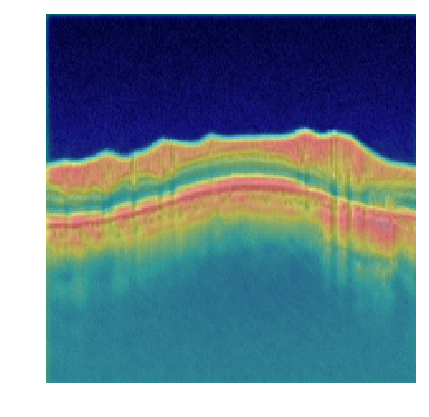

100%|██████████| 64/64 [00:00<00:00, 64.40it/s]


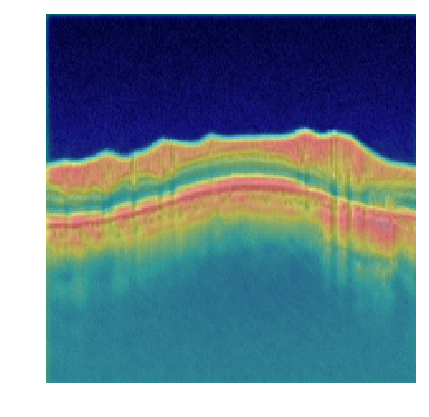

100%|██████████| 64/64 [00:00<00:00, 64.34it/s]


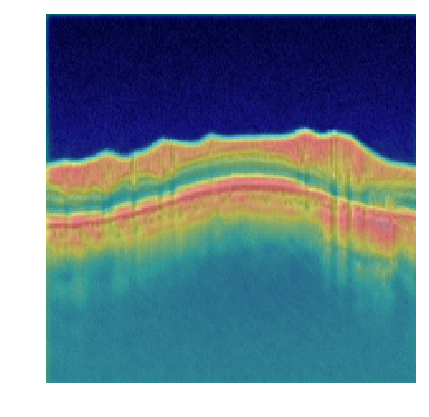

100%|██████████| 64/64 [00:00<00:00, 64.80it/s]


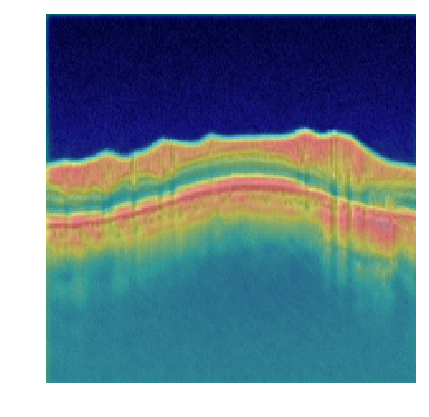

100%|██████████| 64/64 [00:00<00:00, 64.35it/s]


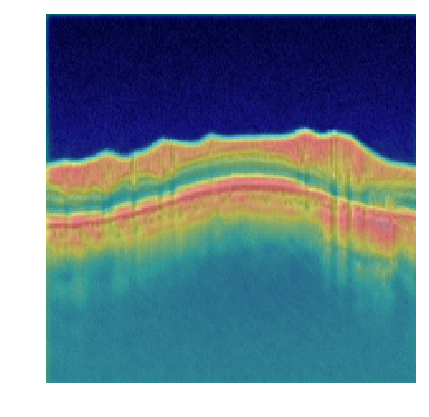

100%|██████████| 64/64 [00:00<00:00, 64.71it/s]


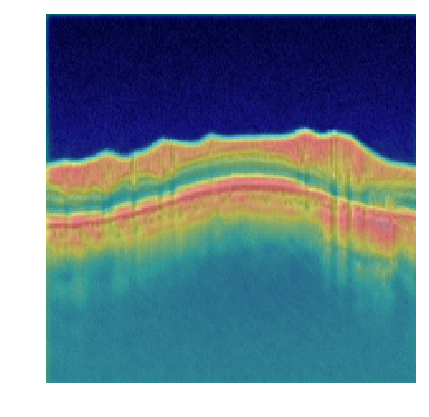

100%|██████████| 64/64 [00:00<00:00, 65.16it/s]


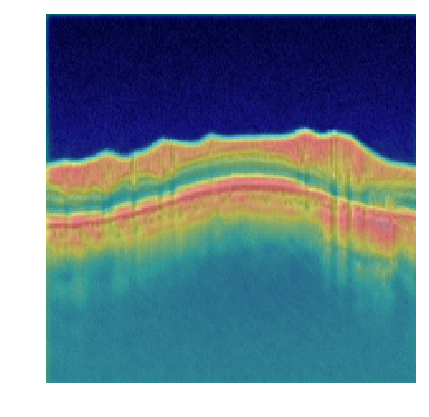

100%|██████████| 64/64 [00:00<00:00, 64.80it/s]


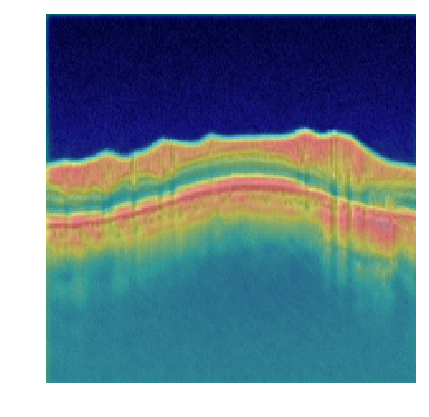

100%|██████████| 64/64 [00:00<00:00, 64.24it/s]


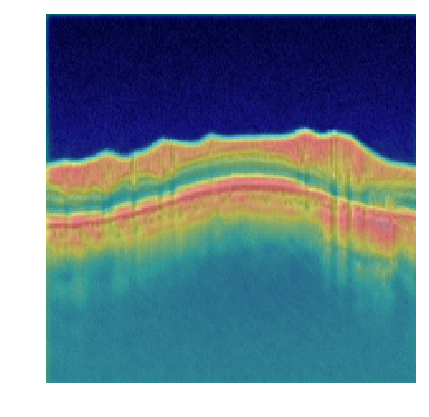

100%|██████████| 64/64 [00:00<00:00, 64.87it/s]


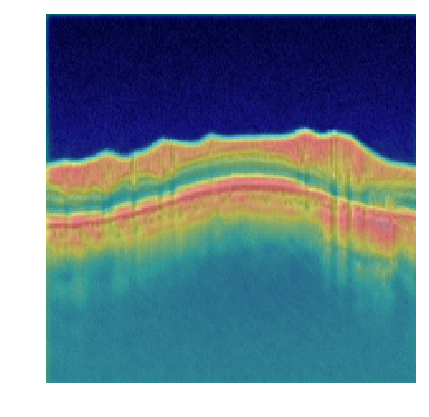

100%|██████████| 64/64 [00:00<00:00, 65.34it/s]


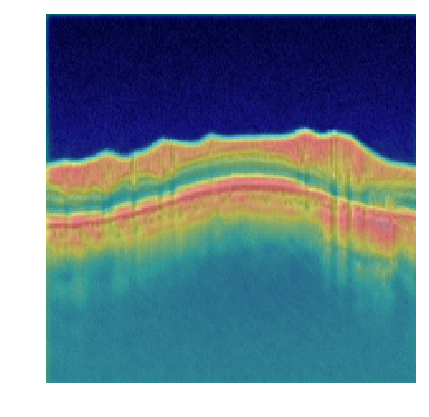

100%|██████████| 64/64 [00:00<00:00, 65.78it/s]


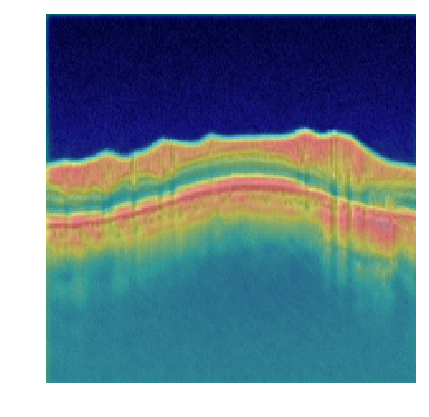

100%|██████████| 64/64 [00:00<00:00, 65.05it/s]


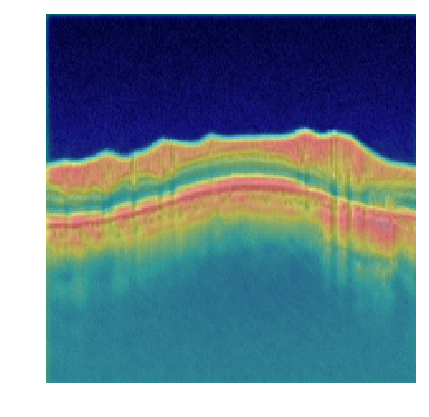

100%|██████████| 64/64 [00:00<00:00, 65.26it/s]


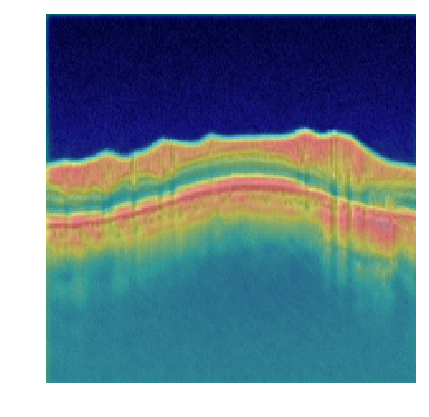

100%|██████████| 64/64 [00:00<00:00, 65.32it/s]


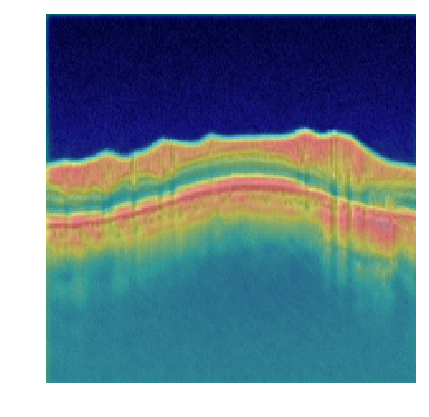

100%|██████████| 64/64 [00:00<00:00, 65.06it/s]


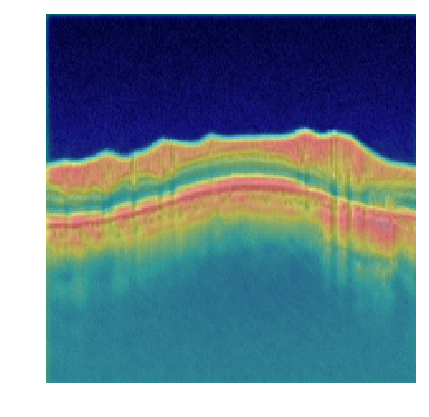

100%|██████████| 64/64 [00:00<00:00, 65.47it/s]


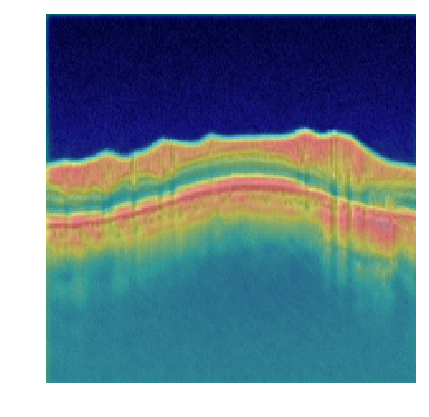

100%|██████████| 64/64 [00:00<00:00, 65.19it/s]


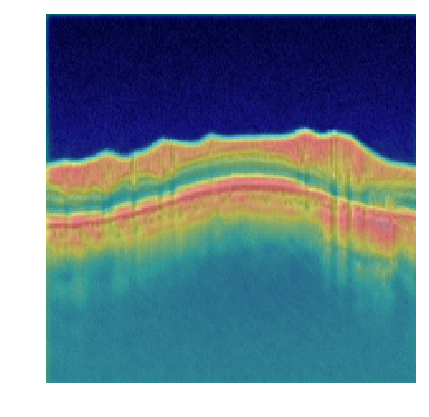

100%|██████████| 64/64 [00:00<00:00, 65.94it/s]


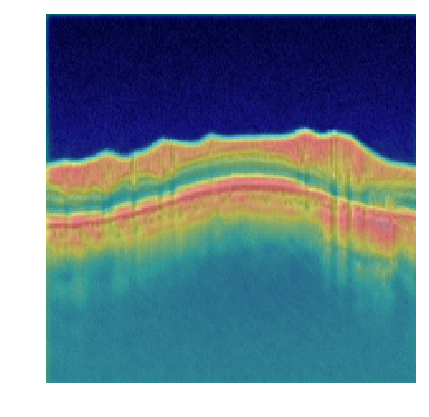

100%|██████████| 64/64 [00:00<00:00, 65.67it/s]


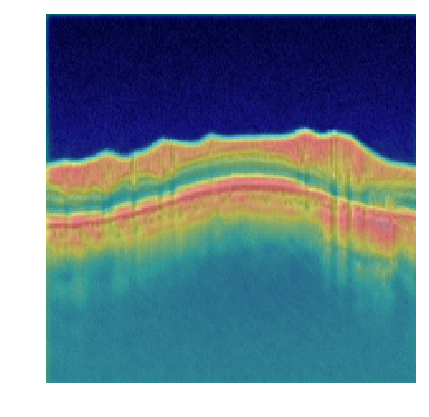

100%|██████████| 64/64 [00:00<00:00, 65.42it/s]


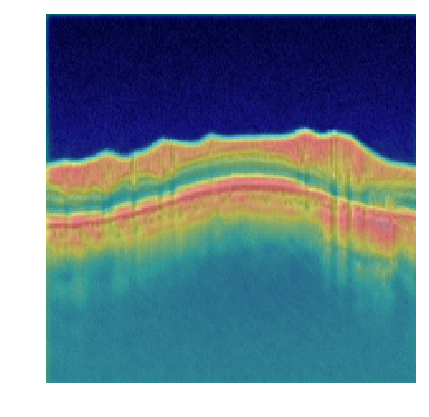

100%|██████████| 64/64 [00:00<00:00, 64.43it/s]


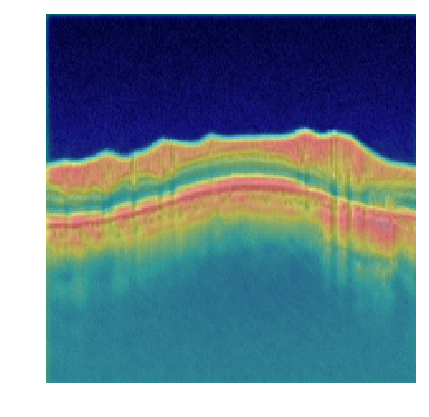

100%|██████████| 64/64 [00:00<00:00, 67.14it/s]


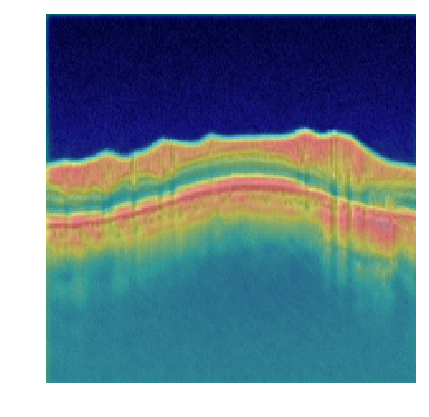

100%|██████████| 64/64 [00:00<00:00, 65.30it/s]


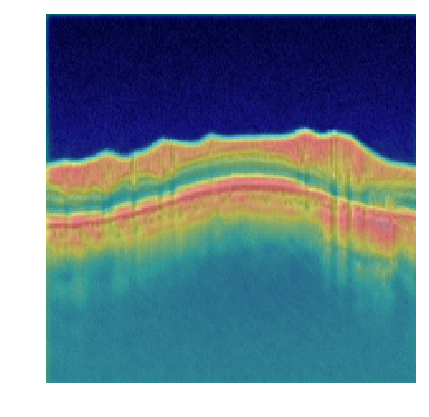

100%|██████████| 64/64 [00:00<00:00, 64.72it/s]


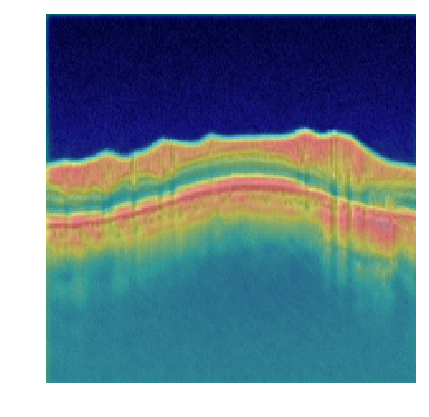

100%|██████████| 64/64 [00:00<00:00, 66.75it/s]


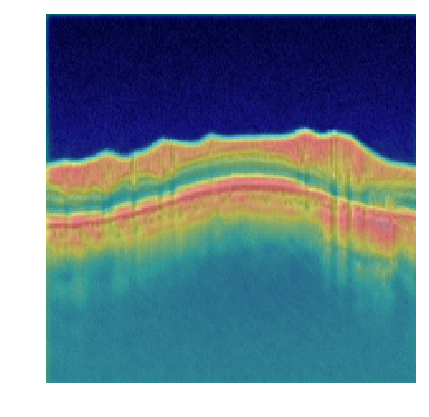

100%|██████████| 64/64 [00:00<00:00, 66.99it/s]


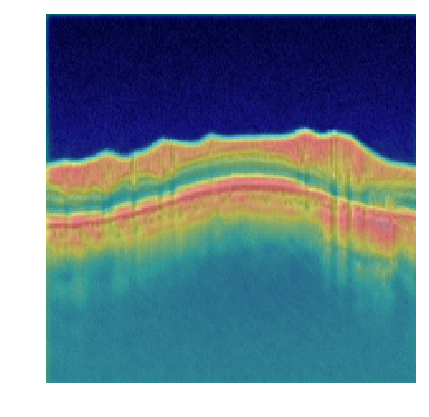

100%|██████████| 64/64 [00:00<00:00, 65.56it/s]


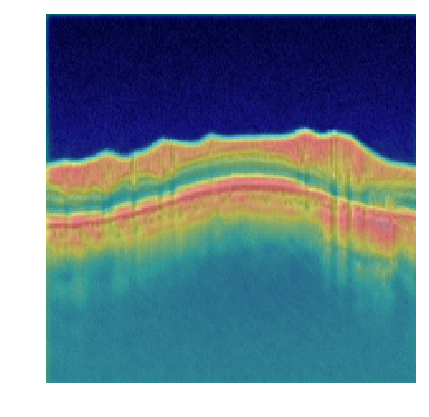

100%|██████████| 64/64 [00:00<00:00, 67.76it/s]


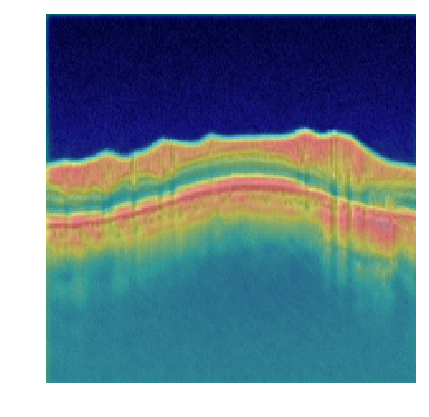

100%|██████████| 64/64 [00:00<00:00, 66.78it/s]


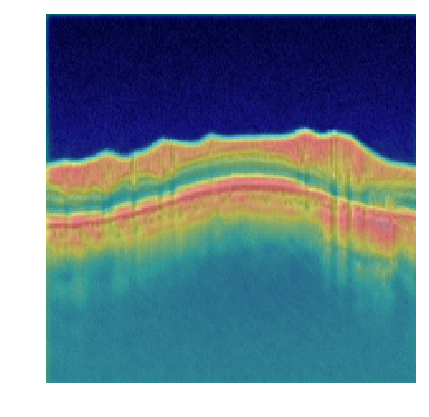

100%|██████████| 64/64 [00:00<00:00, 65.64it/s]


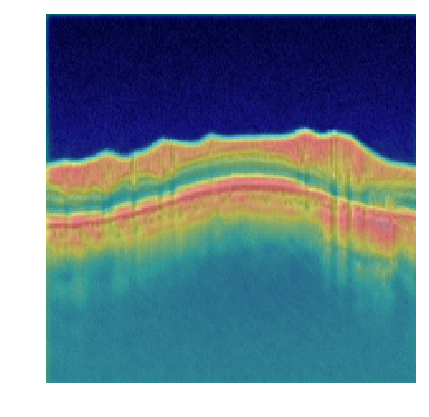

100%|██████████| 64/64 [00:00<00:00, 66.35it/s]


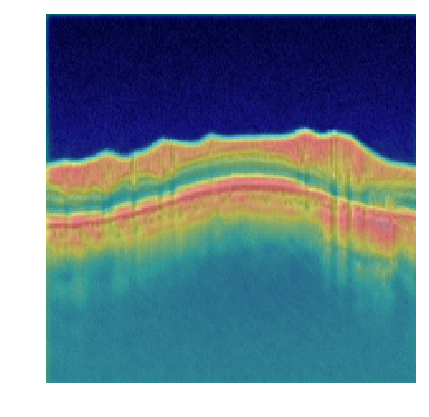

100%|██████████| 64/64 [00:00<00:00, 66.80it/s]


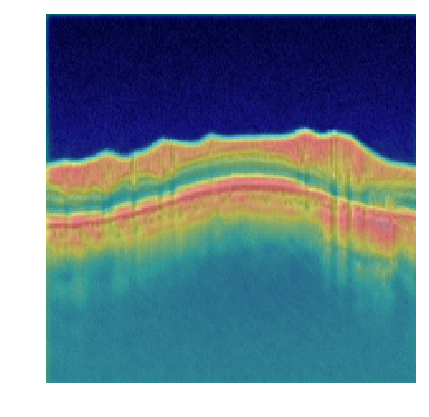

100%|██████████| 64/64 [00:00<00:00, 65.55it/s]


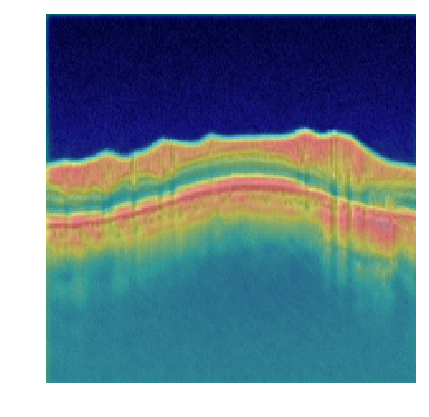

100%|██████████| 64/64 [00:00<00:00, 66.50it/s]


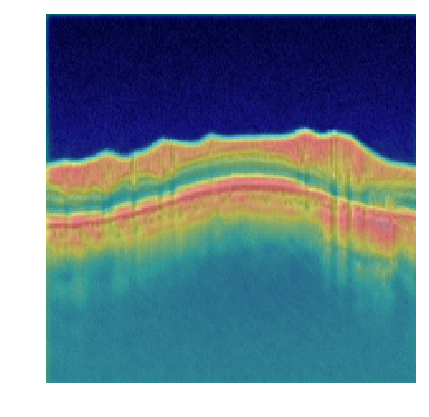

100%|██████████| 64/64 [00:00<00:00, 66.45it/s]


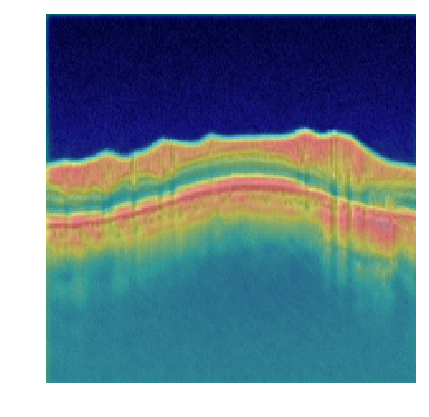

100%|██████████| 64/64 [00:00<00:00, 66.34it/s]


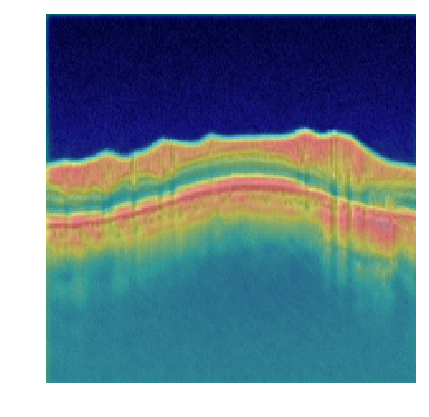

100%|██████████| 64/64 [00:00<00:00, 66.05it/s]


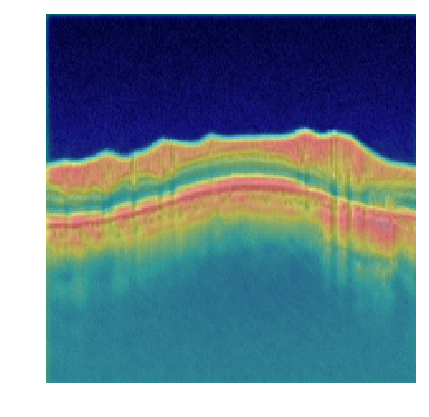

100%|██████████| 64/64 [00:00<00:00, 65.99it/s]


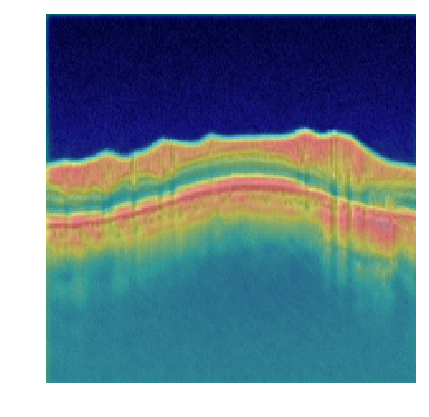

100%|██████████| 64/64 [00:00<00:00, 65.73it/s]


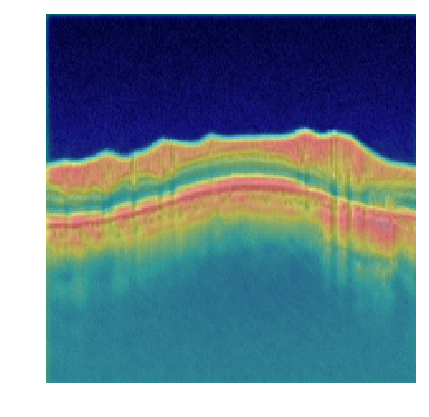

100%|██████████| 64/64 [00:00<00:00, 66.13it/s]


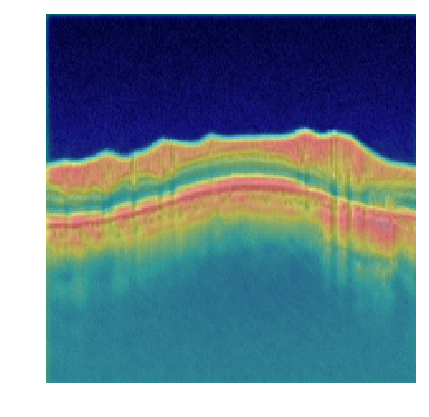

100%|██████████| 64/64 [00:00<00:00, 66.09it/s]


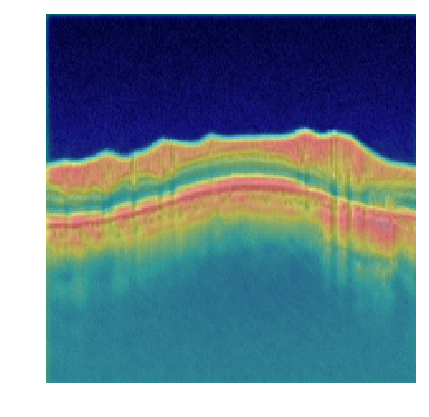

100%|██████████| 64/64 [00:00<00:00, 66.02it/s]


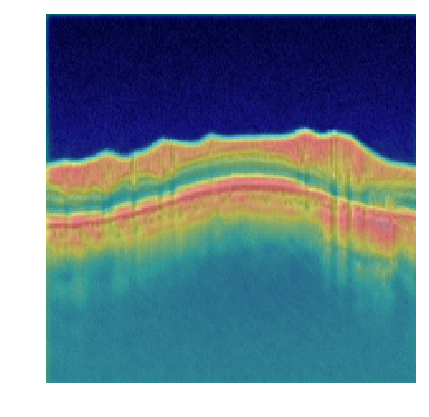

100%|██████████| 64/64 [00:00<00:00, 64.92it/s]


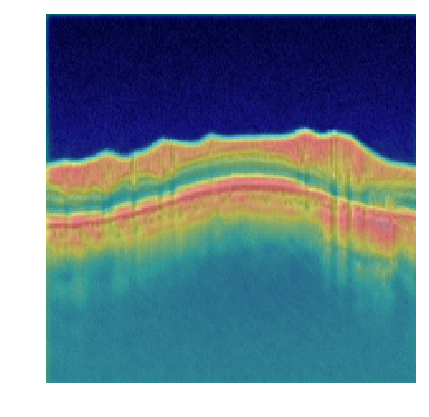

100%|██████████| 64/64 [00:00<00:00, 65.35it/s]


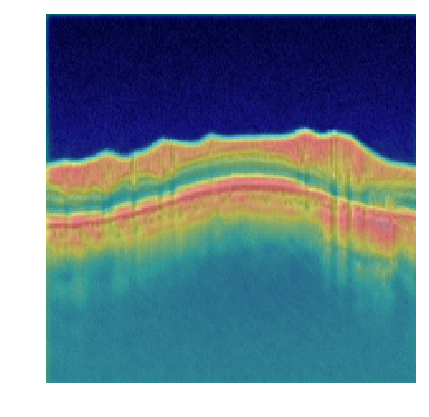

100%|██████████| 64/64 [00:00<00:00, 65.68it/s]


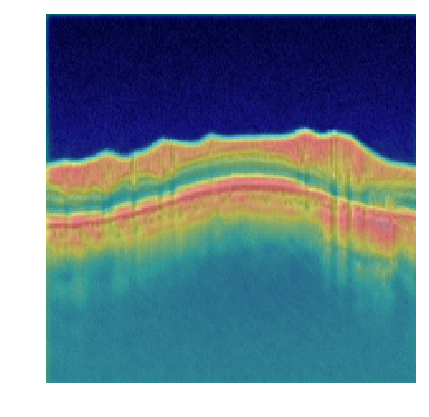

100%|██████████| 64/64 [00:00<00:00, 66.21it/s]


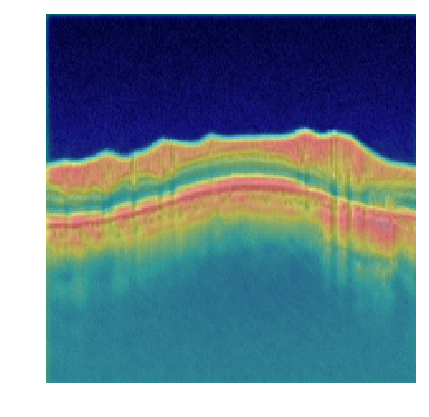

100%|██████████| 64/64 [00:00<00:00, 67.06it/s]


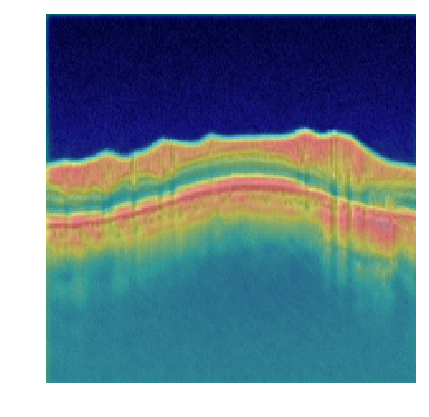

100%|██████████| 64/64 [00:00<00:00, 66.16it/s]


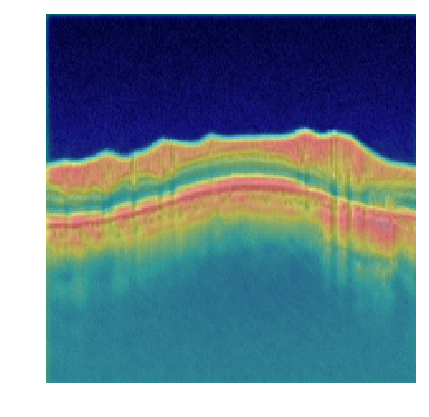

100%|██████████| 64/64 [00:00<00:00, 66.18it/s]


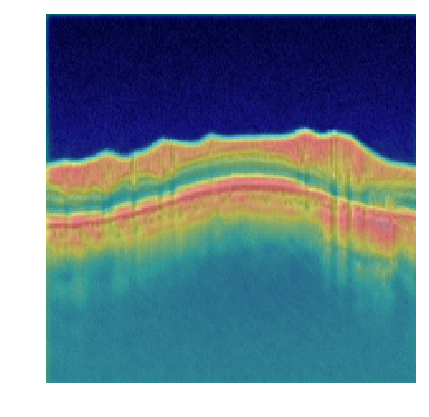

100%|██████████| 64/64 [00:00<00:00, 64.00it/s]


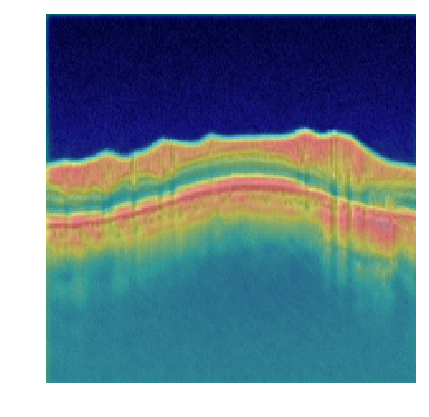

100%|██████████| 64/64 [00:00<00:00, 65.11it/s]


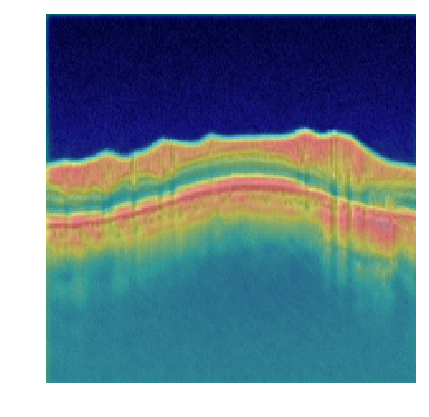

100%|██████████| 64/64 [00:00<00:00, 65.13it/s]


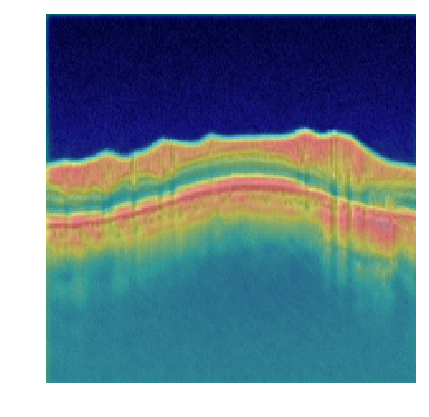

100%|██████████| 64/64 [00:00<00:00, 67.08it/s]


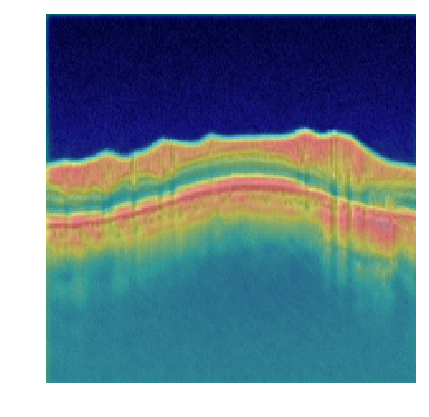

100%|██████████| 64/64 [00:00<00:00, 66.05it/s]


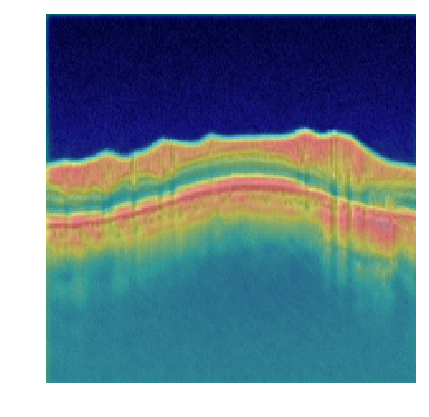

100%|██████████| 64/64 [00:00<00:00, 66.81it/s]


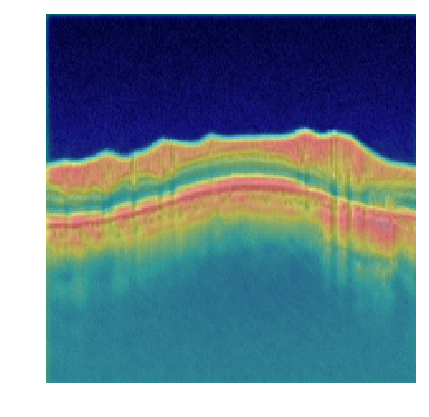

100%|██████████| 64/64 [00:00<00:00, 66.26it/s]


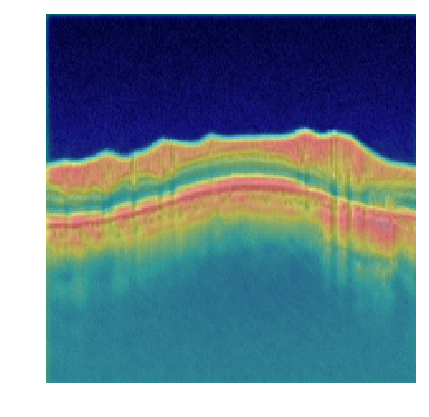

100%|██████████| 64/64 [00:00<00:00, 68.25it/s]


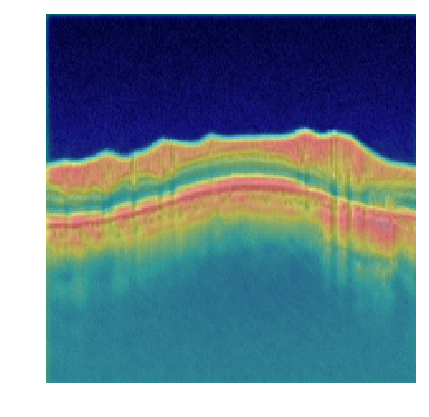

100%|██████████| 64/64 [00:00<00:00, 67.52it/s]


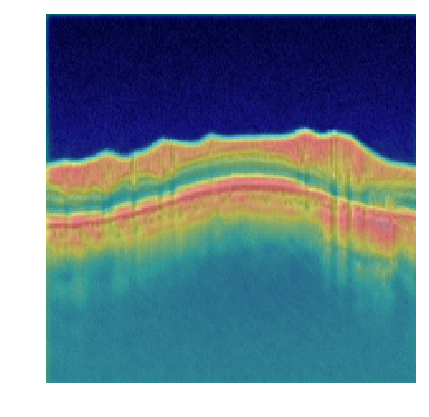

100%|██████████| 64/64 [00:00<00:00, 67.79it/s]


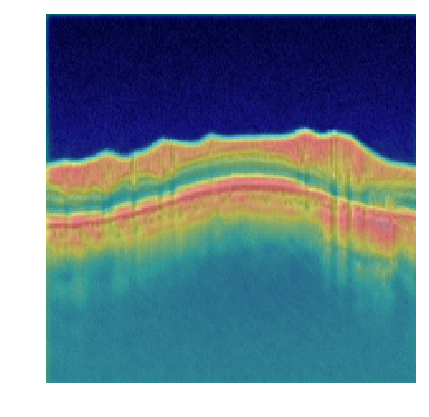

100%|██████████| 64/64 [00:00<00:00, 68.24it/s]


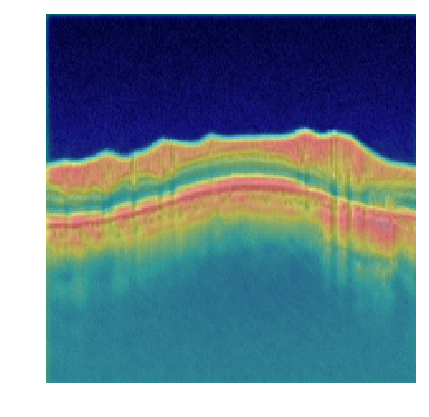

100%|██████████| 64/64 [00:00<00:00, 68.53it/s]


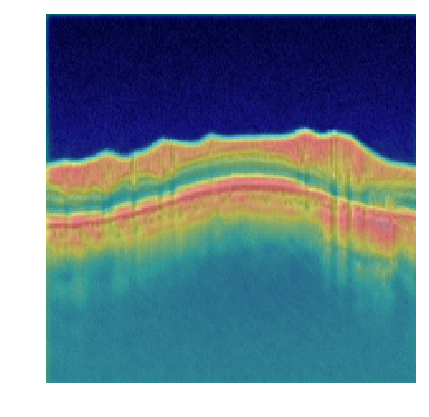

100%|██████████| 64/64 [00:00<00:00, 68.22it/s]


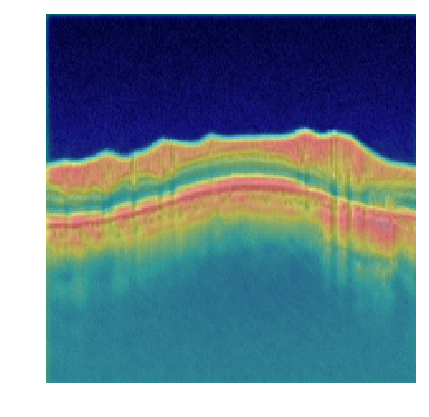

100%|██████████| 64/64 [00:00<00:00, 67.94it/s]


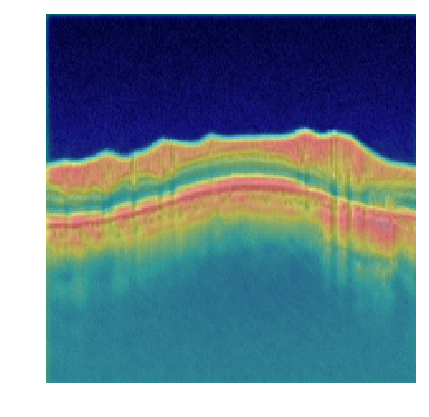

100%|██████████| 64/64 [00:00<00:00, 68.13it/s]


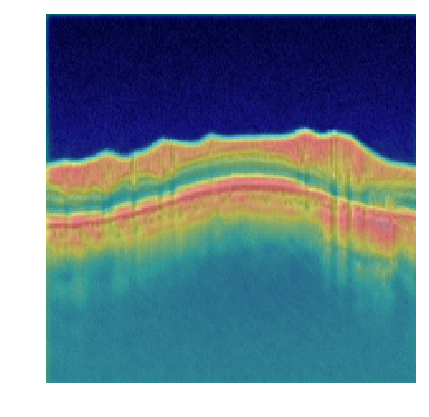

100%|██████████| 64/64 [00:00<00:00, 68.02it/s]


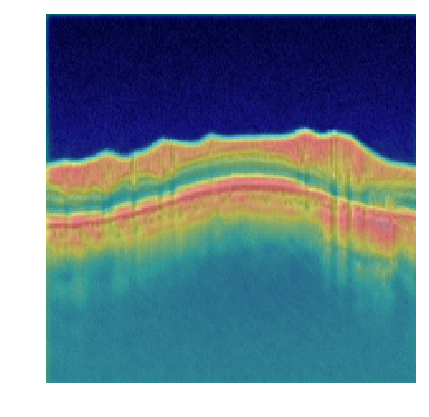

100%|██████████| 64/64 [00:00<00:00, 68.15it/s]


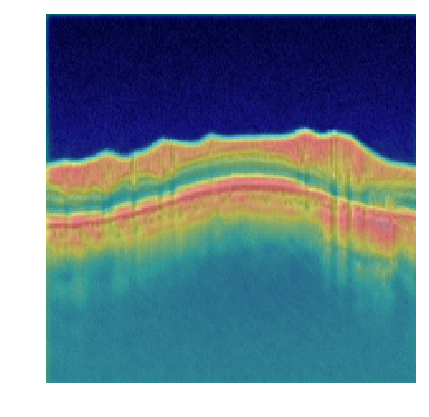

100%|██████████| 64/64 [00:00<00:00, 68.36it/s]


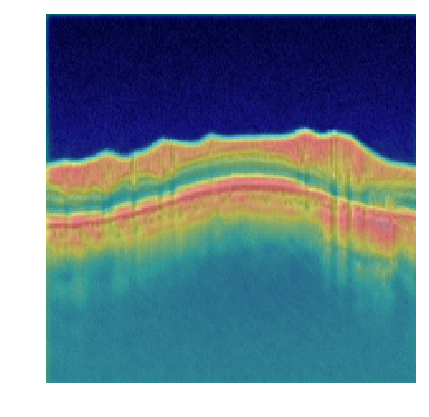

100%|██████████| 64/64 [00:00<00:00, 67.84it/s]


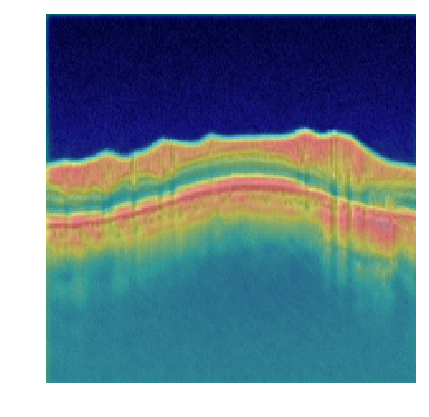

100%|██████████| 64/64 [00:00<00:00, 67.49it/s]


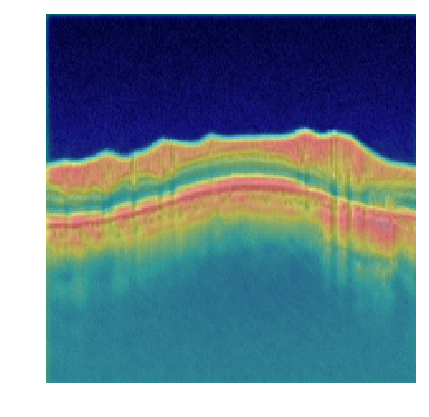

100%|██████████| 64/64 [00:00<00:00, 66.83it/s]


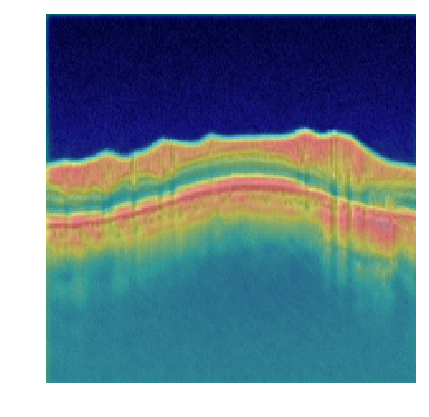

100%|██████████| 64/64 [00:00<00:00, 67.91it/s]


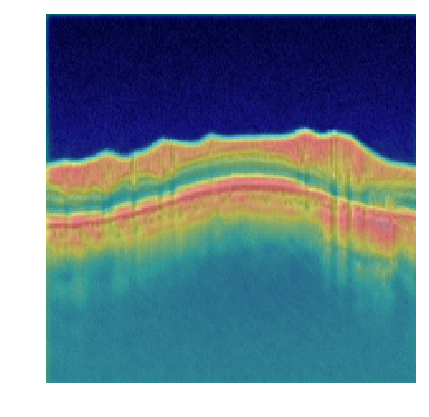

100%|██████████| 64/64 [00:00<00:00, 67.19it/s]


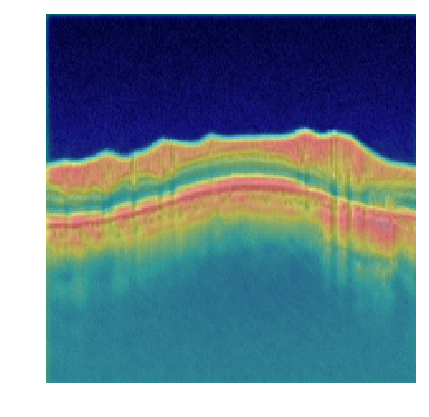

100%|██████████| 64/64 [00:00<00:00, 66.74it/s]


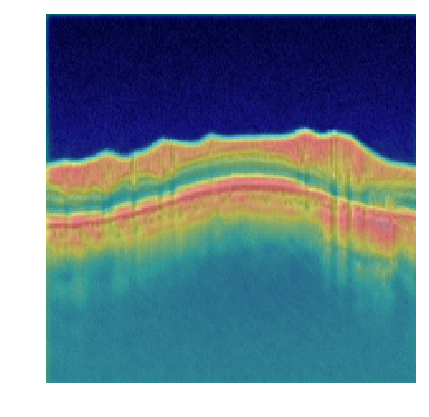

100%|██████████| 64/64 [00:00<00:00, 66.45it/s]


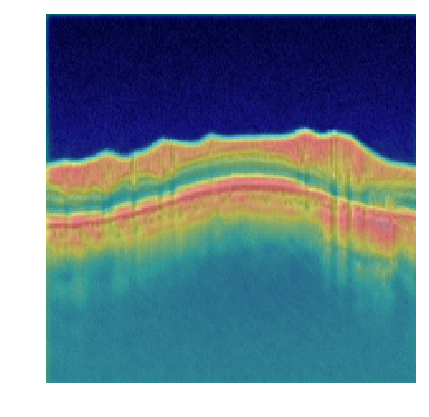

100%|██████████| 64/64 [00:00<00:00, 66.49it/s]


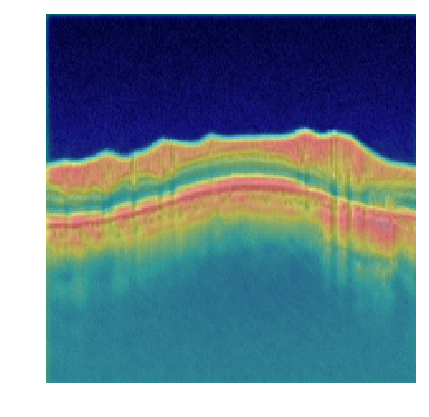

100%|██████████| 64/64 [00:00<00:00, 65.90it/s]


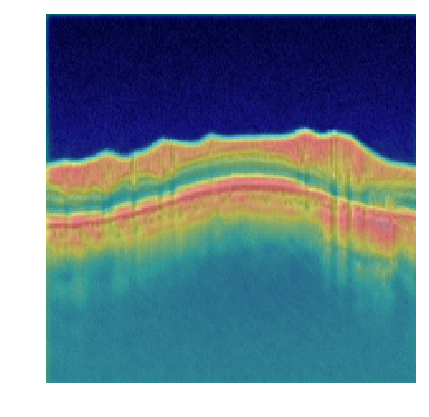

100%|██████████| 64/64 [00:00<00:00, 66.77it/s]


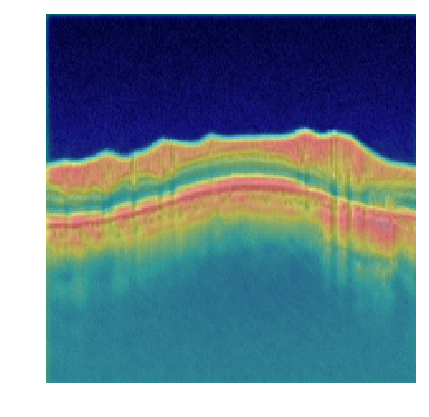

100%|██████████| 64/64 [00:00<00:00, 65.56it/s]


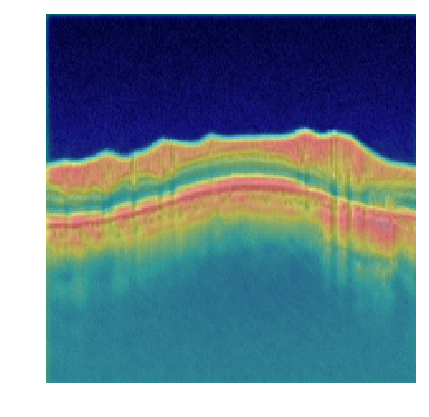

100%|██████████| 64/64 [00:00<00:00, 67.30it/s]


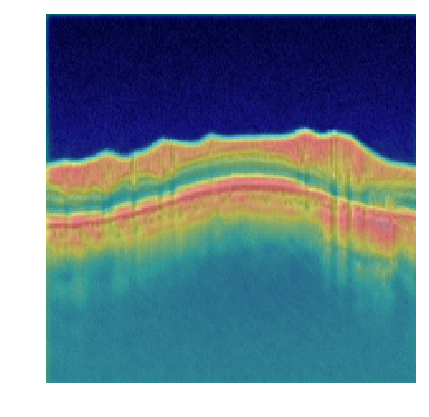

100%|██████████| 64/64 [00:01<00:00, 62.39it/s]


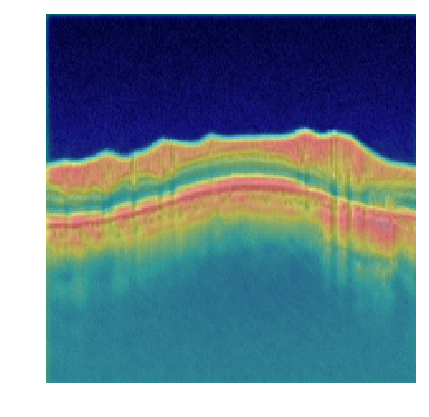

100%|██████████| 64/64 [00:01<00:00, 56.90it/s]


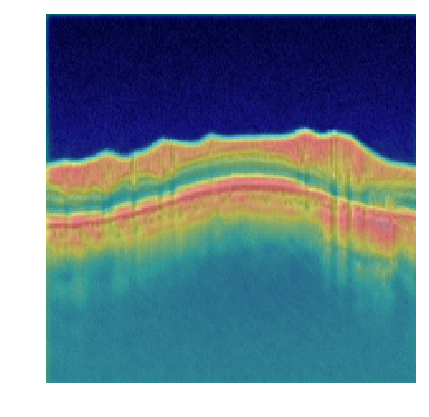

100%|██████████| 64/64 [00:01<00:00, 56.44it/s]


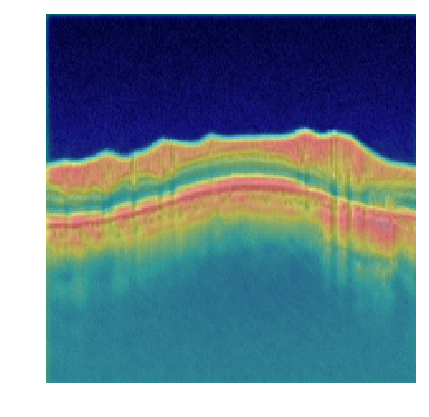

100%|██████████| 64/64 [00:01<00:00, 61.97it/s]


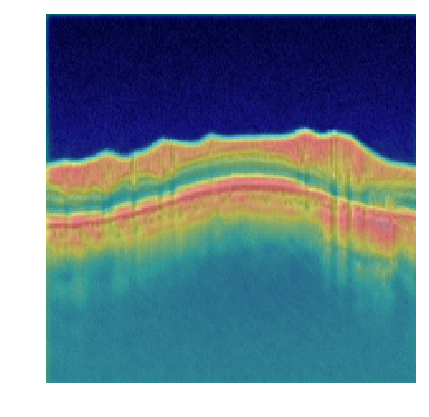

100%|██████████| 64/64 [00:00<00:00, 66.67it/s]


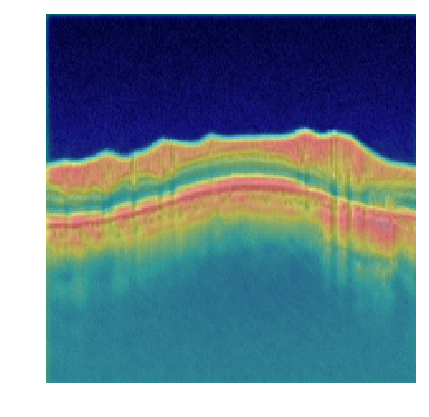

In [12]:
%matplotlib inline
import matplotlib.pyplot as plt
import interpretdl as it
import cv2 as cv
img = cv.imread('data/data175394/GOALS2022/Validation/GC_Label_0/0107.png')
img = cv.resize(img, (224, 224))
sg = it.ScoreCAMInterpreter(model.network, use_cuda=True)
for n, v in model.network.named_sublayers():
    try:
        sg.interpret(img, target_layer_name=n)
    except:
        print('Except')